<a href="https://colab.research.google.com/github/FrankDagbe/UrbanGeoInsights-ML-TimeSeries-Deep-Learning-Notebooks/blob/main/Heat%2C_Waste_%26_Health_(Insurance)_in_Cities.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![Philly Gif](https://drive.google.com/uc?export=view&id=1Ae_pbbKLaIjXU2B268He2HKHLZATah5e)


# **Introduction**

This notebook analyzes and visualizes datasets related to Philadelphia, including Heat Vulnerability Index (HVI), Vital Social Determinants, and Trash 311 Requests.

***Aim***

The aim is to gain insights into the city's environmental and social challenges and identify areas requiring targeted interventions.


***Heat Vulnerability Index***

The HVI dataset reveals that the highest values are concentrated in the city center, indicating a higher vulnerability to heat-related issues.


***Waste in the City***

The Trash 311 Requests dataset shows that the highest number of trash requests are made in July, the hottest month, and are primarily located in the city center, which already has high HVI values.


***Population, Health Insurance & Age***

The Vital Social Determinants dataset indicates that 7.5% of the city's population lacks health insurance, with the majority residing in the city center.
Additionally, the elderly population is primarily located in the city's southwest, which has the highest trash values.


***Indference***

The notebook provides valuable insights into Philadelphia's environmental and social challenges and highlights the need for targeted interventions. The visualizations and analysis can inform policy decisions and contribute to a more sustainable and equitable future for the city.


##Importing Libraries and Mounting Google Drive
First, we import the necessary libraries and mount Google Drive to access the datasets.

In [ ]:
!pip install datashader

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
from google.colab import drive
import os
import folium
from folium.plugins import MarkerCluster
import datashader as ds
import datashader.transfer_functions as tf
import pandas as pd
import colorcet

In [ ]:
# Mount Google Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Loading and Exploring the Datasets
Next, we load the datasets and explore their contents.

In [ ]:
# Specify the folder path and file names
folder_path = '/content/drive/MyDrive/Philly/'

files_in_folder = os.listdir(folder_path)
print(files_in_folder)

file_1_name = 'heat_vulnerability_ct.geojson'
file_2_name = 'Vital_Social_Determinants_PD.shp'
file_3_name = 'trash_311_requests_2020.csv'

# Construct the full file paths
Heat_Vulnerability_Index = f"{folder_path}{file_1_name}"
Social_Determinants = f"{folder_path}{file_2_name}"
Trash = f"{folder_path}{file_3_name}"

# Specify the target CRS
target_crs = 'epsg:4326'


['Vital_Mortality_PD.cpg', 'Vital_Mortality_PD.prj', 'Vital_Mortality_PD.dbf', 'Vital_Mortality_PD.shp', 'Vital_Mortality_PD.shx', 'Vital_Mortality_PD.xml', 'Vital_Social_Determinants_PD.cpg', 'Vital_Social_Determinants_PD.prj', 'Vital_Social_Determinants_PD.xml', 'Vital_Social_Determinants_PD.dbf', 'Vital_Social_Determinants_PD.shp', 'Vital_Natality_PD.cpg', 'Vital_Natality_PD.prj', 'Vital_Natality_PD.shp', 'Vital_Natality_PD.dbf', 'Vital_Natality_PD.shx', 'Vital_Natality_PD.xml', 'ppr_tree_inventory_2023.shp', 'AMS Latest Air Quality Sensor Readings.csv', 'heat_vulnerability_ct.geojson', 'incidents_part1_part2.csv', 'City_Limits.shp', 'trash_311_requests_2020.csv', 'zillow_neighborhoods.geojson', 'With the data you mentioned.docx', 'Vital_Social_Determinants_PD.shx', 'Untitled5.png', 'ezgif-4-b327f5a8a9.gif']


##Data Preprocessing
We preprocess the datasets to handle missing values and convert them into a suitable format for visualization.

In [ ]:
HVI = gpd.read_file(Heat_Vulnerability_Index)
HVI.head()

,geoid10,name10,n_veryhigh,year,hsi_score,hei_score,hvi_score,objectid,Shape__Area,Shape__Length,geometry
0,42101002100,21,0,2023,0.502262,-1.481429,0.639224,1,4.044948e+05,2580.858471,"POLYGON ((-75.17370 39.93624, -75.17378 39.935..."
1,42101002200,22,0,2023,-3.183298,-1.658469,-1.769318,2,3.894601e+05,2518.894793,"POLYGON ((-75.17370 39.93624, -75.17369 39.936..."
2,42101002300,23,0,2023,-6.884403,-1.193579,-4.362779,3,3.616223e+05,2771.142380,"POLYGON ((-75.16702 39.93675, -75.16696 39.936..."
3,42101002400,24,0,2023,-7.107618,-1.382308,-4.462616,4,9.117703e+05,4810.554362,"POLYGON ((-75.16629 39.94004, -75.16623 39.940..."
4,42101034803,348.03,0,2023,-7.830042,-0.358619,-5.684468,5,2.186876e+06,6444.130598,"POLYGON ((-75.00888 40.05866, -75.00915 40.059..."


In [ ]:
# Fill missing HVI scores with the mean
mean_hvi_score = np.mean(HVI['hvi_score'].dropna())  # Calculate mean excluding NaN values
HVI['hvi_score'] = HVI['hvi_score'].fillna(mean_hvi_score)

# Reproject the data to the target CRS
HVI = HVI.to_crs(target_crs)


In [ ]:
# Replace empty strings with NaN and drop rows with NaN values in "lat" or "lon" columns
Trash_Data["lat"] = Trash_Data["lat"].replace('', np.nan)
Trash_Data["lon"] = Trash_Data["lon"].replace('', np.nan)
Trash_Data = Trash_Data.dropna(subset=["lat", "lon"])

# Create a new geometry column using lat and lon
Trash_Data["geometry"] = gpd.points_from_xy(Trash_Data["lon"].astype(float), Trash_Data["lat"].astype(float))

# Create a GeoDataFrame with specified CRS
Trash_Data = gpd.GeoDataFrame(Trash_Data, geometry='geometry', crs=target_crs)


#Data Visualization
Datasets are visualized using various techniques such as choropleth maps, bar plots, and heatmaps.

##Heat Vulnerability Index Choropleth

The Heat Vulnerability Index (HVI) is a measure of how vulnerable different areas of a city are to extreme heat events. In the case of Philadelphia, the HVI appears to have higher values concentrated in the city center. This finding is significant because it suggests that the urban heat island effect, which is caused by the concentration of buildings and pavement in densely populated areas, may be exacerbating heat vulnerability in the city center.

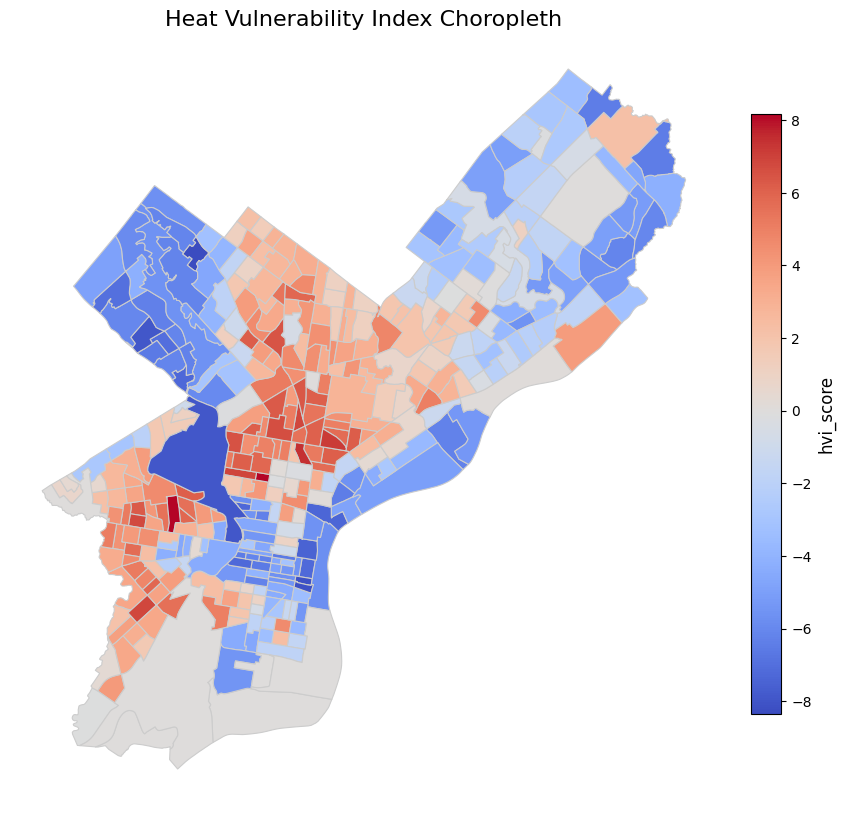

In [ ]:
# Define a function to plot choropleth maps
def plot_choropleth(data, column, cmap, title):
    fig, ax = plt.subplots(1, 1, figsize = (10, 10))
    # Plot the choropleth map
    data.plot(column=column, cmap=cmap, linewidth=0.8, ax=ax, edgecolor='0.8', legend=False)
    ax.set_title(title, fontsize=16)
    ax.axis('off')

    # Add colorbar
    cax = fig.add_axes([0.9, 0.2, 0.03, 0.6])  # [left, bottom, width, height]
    sm = plt.cm.ScalarMappable(cmap=cmap)
    sm.set_array(data[column])
    cbar = fig.colorbar(sm, cax=cax)
    cbar.set_label(column, fontsize=12)

    plt.show()

# Plot choropleth for Heat Vulnerability Index
plot_choropleth(HVI, 'hvi_score', 'coolwarm', 'Heat Vulnerability Index Choropleth')


###Implications
The finding that the HVI is more concentrated in the city center has important implications for urban planning and resource allocation. For example, city officials may want to prioritize greening initiatives and other heat mitigation strategies in the city center to reduce heat vulnerability. Additionally, targeted outreach and education campaigns may be necessary to ensure that residents of the city center are aware of the risks associated with extreme heat and know how to stay safe during heat waves.

#Trash Requests <a id="trash-requests"></a>
## Loading and Preprocessing Data
Next, we'll load the trash requests data, handle missing values, and create a GeoDataFrame.


In [ ]:
Trash_Data = gpd.read_file(Trash)
Trash_Data.head()

,objectid,service_request_id,status,status_notes,service_name,service_code,agency_responsible,service_notice,requested_datetime,updated_datetime,expected_datetime,address,zipcode,media_url,lat,lon,geometry
0,8180042,13269656,Closed,,Rubbish/Recyclable Material Collection,SR-ST03,Streets Department,2 Business Days,2020-04-02 19:22:24,2020-04-06 07:02:57,2020-04-06 20:00:00,624 FOULKROD ST,,,40.034389365,-75.106517846,None
1,8180043,13266979,Closed,,Rubbish/Recyclable Material Collection,SR-ST03,Streets Department,2 Business Days,2020-04-02 08:40:53,2020-04-06 07:02:58,2020-04-05 20:00:00,1203 ELLSWORTH ST,,,39.936164421,-75.163497001,None
2,7744426,13066443,Closed,,Rubbish/Recyclable Material Collection,SR-ST03,Streets Department,2 Business Days,2020-01-02 19:17:55,2020-01-04 05:46:06,2020-01-06 19:00:00,9054 WESLEYAN RD,,,40.058736909,-75.018345446,None
3,7744427,13066540,Closed,,Rubbish/Recyclable Material Collection,SR-ST03,Streets Department,2 Business Days,2020-01-03 07:01:46,2020-01-04 05:46:07,2020-01-06 19:00:00,2784 WILLITS RD,,,40.063657989,-75.022347204,None
4,7801094,13089345,Closed,,Rubbish/Recyclable Material Collection,SR-ST03,Streets Department,2 Business Days,2020-01-15 13:22:14,2020-01-16 14:03:29,2020-01-16 19:00:00,6137 LOCUST ST,,,39.958185682,-75.244731903,None


In [ ]:
# Replace empty strings with NaN
Trash_Data["lat"] = Trash_Data["lat"].replace('', np.nan)
Trash_Data["lon"] = Trash_Data["lon"].replace('', np.nan)

# Drop rows with NaN values in "lat" or "lon" columns
Trash_Data = Trash_Data.dropna(subset=["lat", "lon"])

# Create a new geometry column using lat and lon
Trash_Data["geometry"] = gpd.points_from_xy(Trash_Data["lon"].astype(float), Trash_Data["lat"].astype(float))

# Print the first few rows of the new geometry column
print(Trash_Data["geometry"].head())


0    POINT (-75.10652 40.03439)
1    POINT (-75.16350 39.93616)
2    POINT (-75.01835 40.05874)
3    POINT (-75.02235 40.06366)
4    POINT (-75.24473 39.95819)
Name: geometry, dtype: geometry


In [ ]:
# Define the CRS
target_crs

# Create a GeoDataFrame with specified CRS
Trash_Data = gpd.GeoDataFrame(Trash_Data, geometry='geometry', crs=target_crs)

# Print the GeoDataFrame info to verify CRS
print(Trash_Data.info())

# Print the first few rows of the GeoDataFrame
Trash_Data.head()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 47690 entries, 0 to 47729
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype   
---  ------              --------------  -----   
 0   objectid            47690 non-null  object  
 1   service_request_id  47690 non-null  object  
 2   status              47690 non-null  object  
 3   status_notes        47690 non-null  object  
 4   service_name        47690 non-null  object  
 5   service_code        47690 non-null  object  
 6   agency_responsible  47690 non-null  object  
 7   service_notice      47690 non-null  object  
 8   requested_datetime  47690 non-null  object  
 9   updated_datetime    47690 non-null  object  
 10  expected_datetime   47690 non-null  object  
 11  address             47690 non-null  object  
 12  zipcode             47690 non-null  object  
 13  media_url           47690 non-null  object  
 14  lat                 47690 non-null  object  
 15  lon                 47690 non-nul

,objectid,service_request_id,status,status_notes,service_name,service_code,agency_responsible,service_notice,requested_datetime,updated_datetime,expected_datetime,address,zipcode,media_url,lat,lon,geometry
0,8180042,13269656,Closed,,Rubbish/Recyclable Material Collection,SR-ST03,Streets Department,2 Business Days,2020-04-02 19:22:24,2020-04-06 07:02:57,2020-04-06 20:00:00,624 FOULKROD ST,,,40.034389365,-75.106517846,POINT (-75.10652 40.03439)
1,8180043,13266979,Closed,,Rubbish/Recyclable Material Collection,SR-ST03,Streets Department,2 Business Days,2020-04-02 08:40:53,2020-04-06 07:02:58,2020-04-05 20:00:00,1203 ELLSWORTH ST,,,39.936164421,-75.163497001,POINT (-75.16350 39.93616)
2,7744426,13066443,Closed,,Rubbish/Recyclable Material Collection,SR-ST03,Streets Department,2 Business Days,2020-01-02 19:17:55,2020-01-04 05:46:06,2020-01-06 19:00:00,9054 WESLEYAN RD,,,40.058736909,-75.018345446,POINT (-75.01835 40.05874)
3,7744427,13066540,Closed,,Rubbish/Recyclable Material Collection,SR-ST03,Streets Department,2 Business Days,2020-01-03 07:01:46,2020-01-04 05:46:07,2020-01-06 19:00:00,2784 WILLITS RD,,,40.063657989,-75.022347204,POINT (-75.02235 40.06366)
4,7801094,13089345,Closed,,Rubbish/Recyclable Material Collection,SR-ST03,Streets Department,2 Business Days,2020-01-15 13:22:14,2020-01-16 14:03:29,2020-01-16 19:00:00,6137 LOCUST ST,,,39.958185682,-75.244731903,POINT (-75.24473 39.95819)


## Visualizing Trash Requests
One interesting finding from this analysis is that the highest number of trash requests were made in the month of July, which is also the hottest month in Philadelphia. This suggests that there may be a correlation between heat and waste generation, with hotter temperatures leading to increased waste production and disposal.

Furthermore, the analysis shows that the highest number of trash requests are found in the city center, which is also where the highest HVI values are concentrated. This finding is significant because it suggests that the areas of the city that are most vulnerable to extreme heat events are also the areas that are generating the most waste. This has important implications for waste management and resource allocation, as it suggests that targeted interventions may be necessary to address waste management issues in these areas.


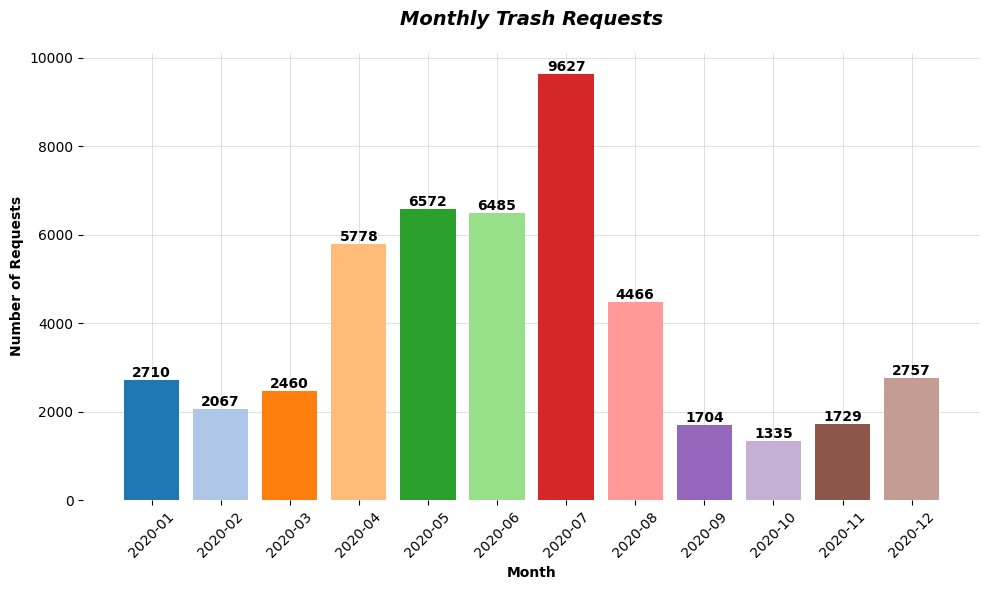

In [ ]:
Trash_Data['requested_datetime'] = pd.to_datetime(Trash_Data['requested_datetime'])
Trash_Data['month'] = Trash_Data['requested_datetime'].dt.strftime('%Y-%m')
monthly_requests = Trash_Data.groupby('month')['service_request_id'].count().reset_index(name='count')


# Plot monthly trash requests using tab20 color palette
plt.figure(figsize=(10, 6))

# Add light grey grid
plt.grid(color='lightgrey', linestyle='-', linewidth=0.5, zorder=0)

bars = plt.bar(monthly_requests["month"], monthly_requests["count"], color=plt.cm.tab20.colors, zorder=2)

# Remove borders
plt.box(False)

# Add x and y labels
plt.xlabel('Month', fontweight='bold')
plt.ylabel('Number of Requests', fontweight='bold')

# Rotate x-axis labels by 45 degrees
plt.xticks(rotation=45)

# Add data labels in bold
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, height, '%d' % int(height), ha='center', va='bottom', fontweight='bold')

# Title with bold and underline
plt.title('Monthly Trash Requests', fontsize=14, fontweight='bold', loc='center', pad=20, style='italic')

plt.tight_layout()
plt.show()


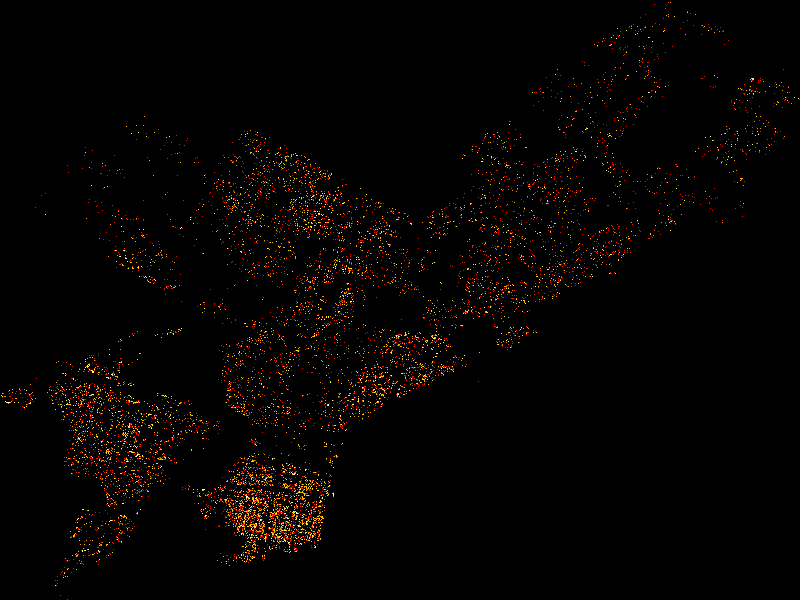

In [ ]:
# Convert 'lon' and 'lat' columns to numeric
Trash_Data['lon'] = pd.to_numeric(Trash_Data['lon'], errors='coerce')
Trash_Data['lat'] = pd.to_numeric(Trash_Data['lat'], errors='coerce')

# Drop rows with NaN values in 'lon' or 'lat' columns
Trash_Data = Trash_Data.dropna(subset=['lon', 'lat'])

# Create a canvas using Datashader
canvas = ds.Canvas(plot_width=800, plot_height=600)

# Adjust the canvas parameters to create a binning effect
# You can experiment with different values here to achieve the desired clustering effect
canvas = ds.Canvas(plot_width=800, plot_height=600, x_range=(Trash_Data['lon'].min(), Trash_Data['lon'].max()), y_range=(Trash_Data['lat'].min(), Trash_Data['lat'].max()))

# Aggregate the points into pixels using the count function
agg = canvas.points(Trash_Data, 'lon', 'lat', agg=ds.count())

# Shade the aggregated points using the 'fire' colormap from colorcet
img = tf.shade(agg, cmap=colorcet.fire)

# Format: set the background of the image to black
img = tf.set_background(img, "black")

# Display the image
img


In [ ]:
# Create a map centered at the mean latitude and longitude of Trash_Data
center_lat = Trash_Data.geometry.y.mean()
center_lon = Trash_Data.geometry.x.mean()

# Specify initial zoom level
zoom_start = 13

# Create the map with zoom level control
m = folium.Map(location=[center_lat, center_lon], zoom_start=zoom_start)

# Add HVI shapefile to the map
folium.GeoJson(HVI).add_to(m)

# Create a MarkerCluster layer for the trash data geometries
marker_cluster = MarkerCluster().add_to(m)

# Add trash data points to the MarkerCluster layer
for idx, row in Trash_Data.iterrows():
    folium.Marker(location=[row['geometry'].y, row['geometry'].x]).add_to(marker_cluster)

# Display the map
m


**If you cannot see this interactive map, you are probably reading directly from Github. Kindly read directly from colab by clicking** [here](https://colab.research.google.com/drive/1K7r4M7QOBEn-rbTGz8o9E3yOZ0JIRnZM?usp=sharing)

#Social Determinants <a id="social-determinants"></a>
##Loading and Preprocessing Data
Finally, we'll load the social determinants data, reproject it, and explore the dataset.


In [ ]:
Social_Data = gpd.read_file(Social_Determinants)
Social_Data.head()

,OBJECTID,GEOGRAPHY_,METRIC_NAM,YEAR,METRIC_VAL,SOURCE,GEOGRAPHY,Shape__Are,Shape__Len,geometry
0,1,Central,unemployment_rate_in_population_16_and_older,2014,6.296687,American Community Survey 5-Year Estimates,Planning district,2.822133e+07,28401.823065,"POLYGON ((-75.14791 39.96733, -75.14715 39.967..."
1,2,Central,unemployment_rate_in_population_16_and_older,2019,3.385665,American Community Survey 5-Year Estimates,Planning district,2.822133e+07,28401.823065,"POLYGON ((-75.14791 39.96733, -75.14715 39.967..."
2,3,Central,percent_of_population_identifying_as_nh_black,2020,12.112232,American Community Survey 5-Year Estimates,Planning district,2.822133e+07,28401.823065,"POLYGON ((-75.14791 39.96733, -75.14715 39.967..."
3,4,Central,percent_of_population_age_65_or_older,2020,14.472411,American Community Survey 5-Year Estimates,Planning district,2.822133e+07,28401.823065,"POLYGON ((-75.14791 39.96733, -75.14715 39.967..."
4,5,Central,unemployment_rate_in_population_16_and_older,2020,3.435896,American Community Survey 5-Year Estimates,Planning district,2.822133e+07,28401.823065,"POLYGON ((-75.14791 39.96733, -75.14715 39.967..."


In [ ]:
# Reproject the data to the target CRS
Social_Data = Social_Data.to_crs(target_crs)

# Group the social data by "METRIC_NAM"
grouped_data = Social_Data.groupby("METRIC_NAM")

# Group the social data by "METRIC_NAM"
grouped_data = Social_Data.groupby("METRIC_NAM").groups

# Display the names of the different groups
for group_name in grouped_data.keys():
    print(group_name)


percent_of_adult_population_without_bachelors_degree
percent_of_population_age_65_or_older
percent_of_population_identifying_as_hispanic
percent_of_population_identifying_as_nh_asian_pi
percent_of_population_identifying_as_nh_black
percent_of_population_identifying_as_nh_multiracial
percent_of_population_identifying_as_nh_white
percent_of_population_in_poverty
percent_of_population_reporting_no_checkup_in_past_year
percent_of_population_with_a_disability
percent_of_population_without_health_insurance
unemployment_rate_in_population_16_and_older


## Analyzing Social Determinants

The Vital Social Determinants dataset provides important insights into the social factors that affect health outcomes in Philadelphia. One key finding from this analysis is that 7.5% of the population does not have health insurance. Furthermore, the choropleth plot shows that the population without health insurance is primarily located in the city center, which is also where the highest HVI values and highest trash requests are concentrated. This suggests that the areas of the city that are most vulnerable to extreme heat events and waste management issues are also the areas where residents may have limited access to healthcare services.


Another important social determinant of health is age. The analysis shows that the population aged 65 and above is primarily located in the southwest of the city, which is also where the highest trash values are found across the entire city. This suggests that the areas of the city with a higher proportion of older adults may also be facing waste management challenges..

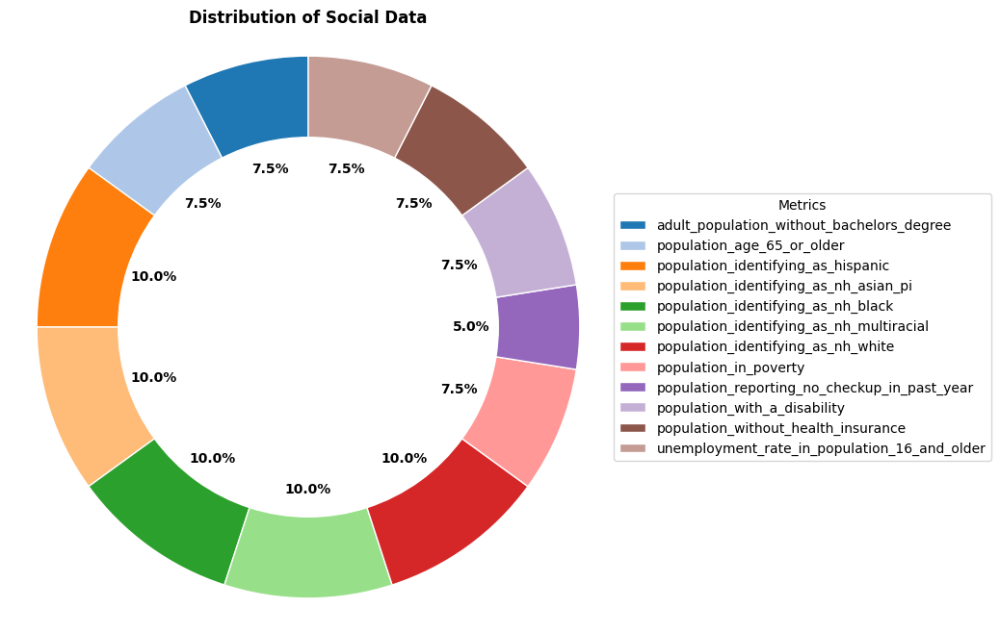

In [ ]:
grouped_data = Social_Data.groupby("METRIC_NAM").size()

# Remove 'percent_of_' from the group data labels
grouped_data.index = grouped_data.index.str.replace('percent_of_', '')

# Plotting
plt.figure(figsize=(8, 8))

# Create pie chart with specified parameters
wedges, _, autotexts = plt.pie(grouped_data, startangle=90, autopct='%1.1f%%', colors=plt.cm.tab20.colors, wedgeprops=dict(width=0.3, edgecolor='w'))

# Bolden percentages
for autotext in autotexts:
    autotext.set_fontweight('bold')

# Set aspect ratio to equal for a circular shape
plt.axis('equal')

# Title
title_text = 'Distribution of Social Data'
plt.title(title_text, loc='center', fontweight='bold')

# Move legend to the right
plt.legend(grouped_data.index, loc='center left', bbox_to_anchor=(1, 0.5), fontsize='medium', title="Metrics")

# Display the pie chart
plt.show()


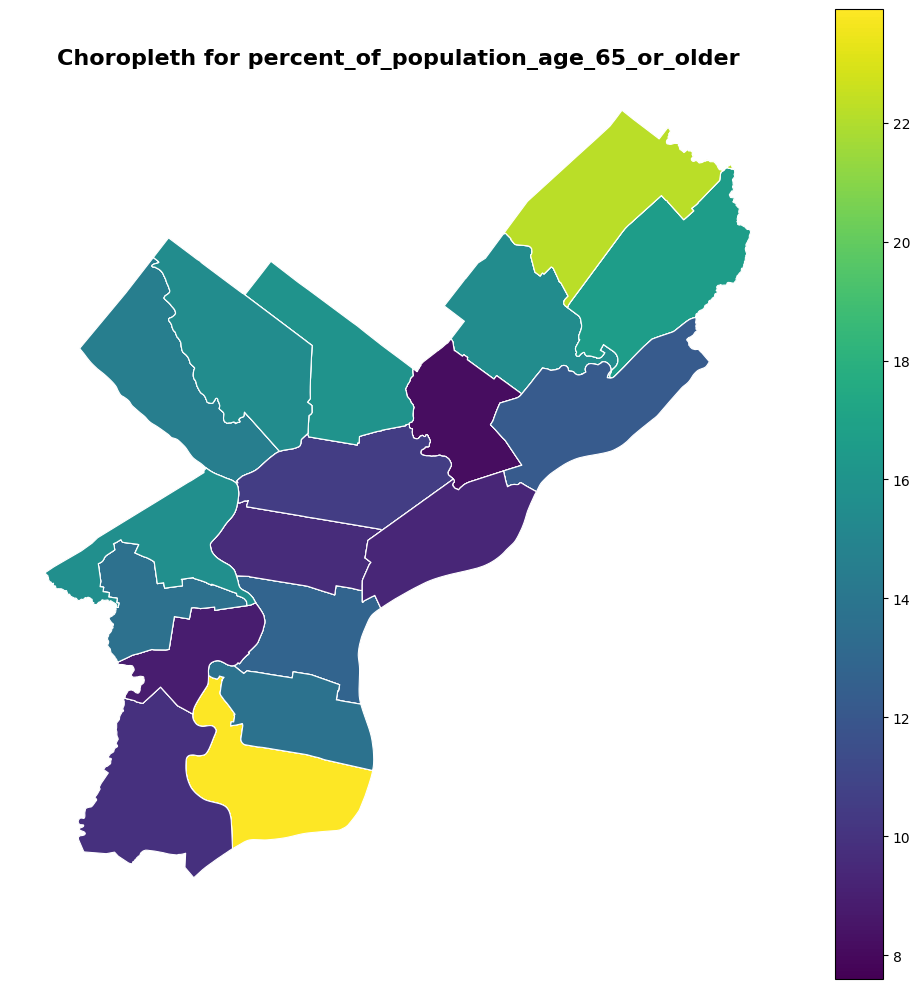

In [ ]:
# Choosing the group (metric name) to plot
group_name_to_plot = "percent_of_population_age_65_or_older"

# Filter the data for the chosen group
group_data = Social_Data[Social_Data['METRIC_NAM'] == group_name_to_plot]

# Plot the choropleth
fig, ax = plt.subplots(figsize=(10, 10))
group_data.plot(ax=ax, column='METRIC_VAL', legend=True, cmap='viridis', edgecolor='white', linewidth=0.8, norm=plt.Normalize(vmin=group_data['METRIC_VAL'].min(), vmax=group_data['METRIC_VAL'].max()),)
ax.set_title(f'Choropleth for {group_name_to_plot}', fontsize=16, fontweight='bold')
ax.set_axis_off()  # Turn off axis
plt.tight_layout()  # Adjust layout
plt.show()


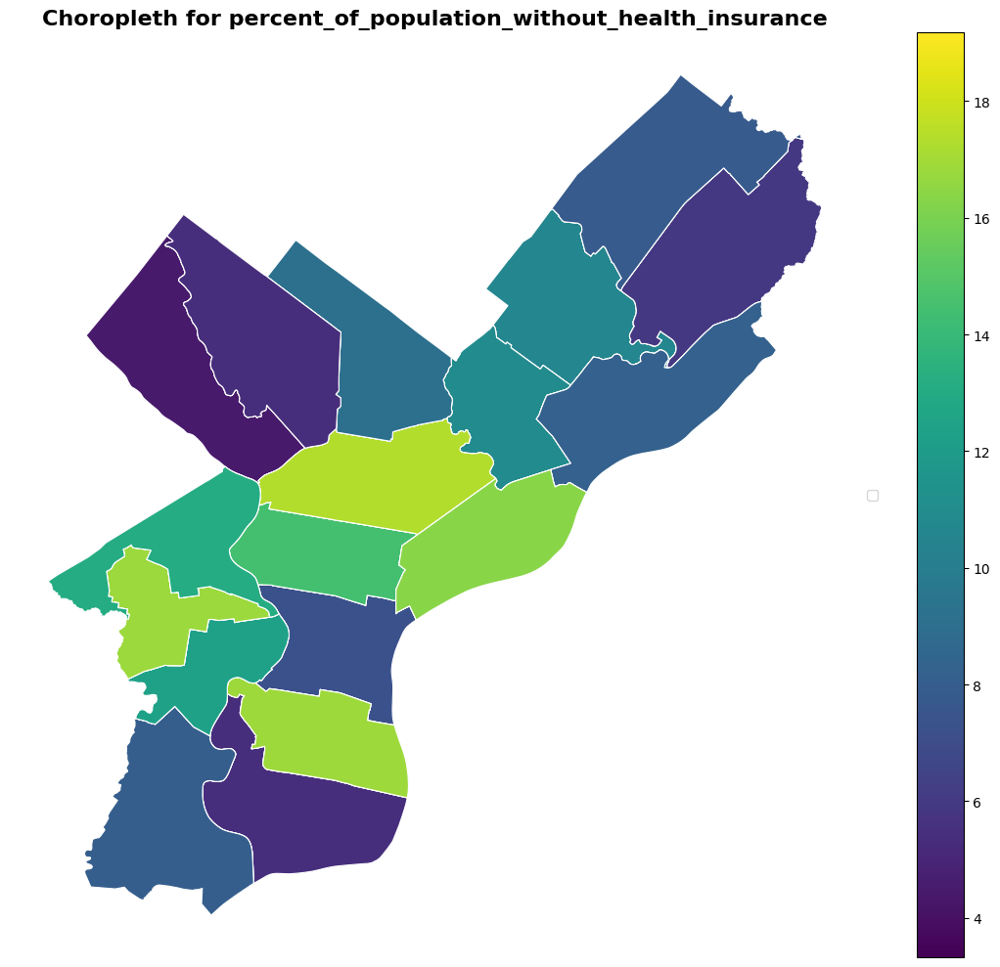

In [ ]:
# Choosing the group (metric name) to plot
group_name_to_plot = "percent_of_population_without_health_insurance"

# Filter the data for the chosen group
group_data = Social_Data[Social_Data['METRIC_NAM'] == group_name_to_plot]

# Plot the choropleth
fig, ax = plt.subplots(figsize=(14, 10))
group_data.plot(ax=ax, column='METRIC_VAL', legend=True, cmap='viridis', edgecolor='white', linewidth=0.8)
ax.set_title(f'Choropleth for {group_name_to_plot}', fontsize=16, fontweight='bold')
ax.set_axis_off()  # Turn off axis

# Adjust legend size and position
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='medium')

# Adjust layout to make space for legend
plt.tight_layout(rect=[0, 0, 0.85, 1])

plt.show()


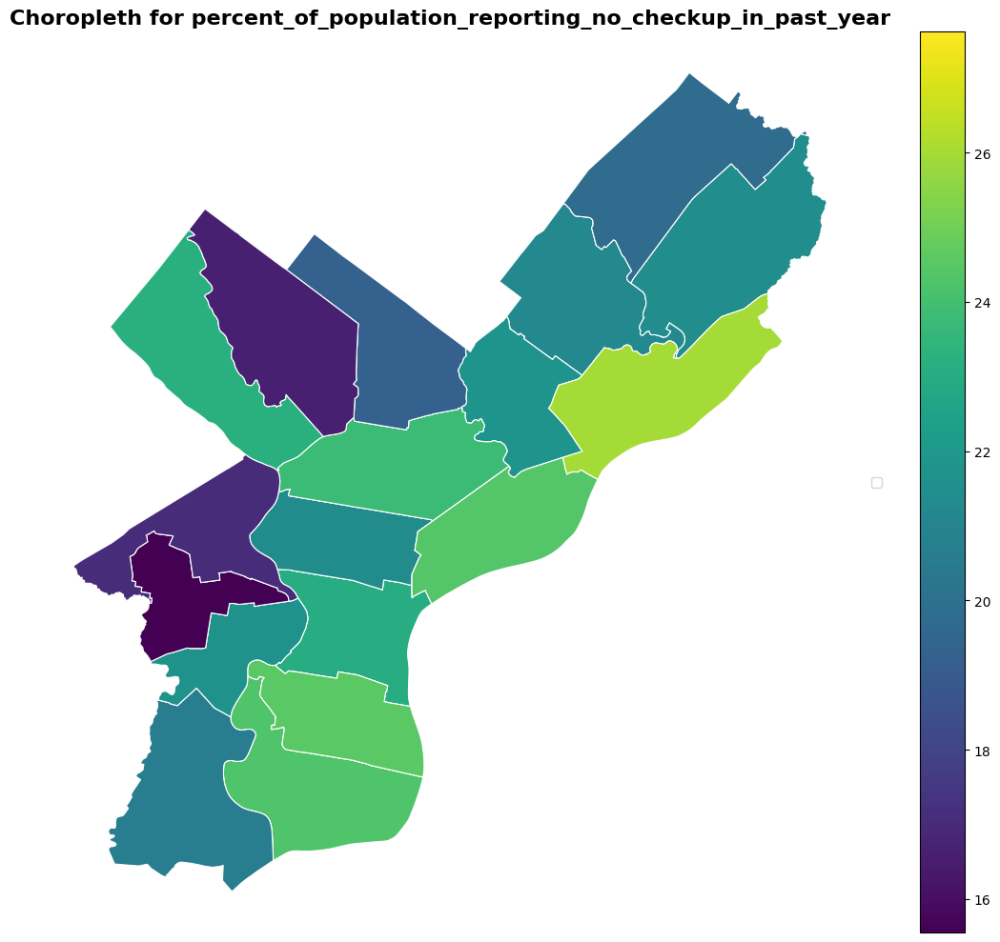

In [ ]:
# Choosing the group (metric name) to plot
group_name_to_plot = "percent_of_population_reporting_no_checkup_in_past_year"

# Filter the data for the chosen group
group_data = Social_Data[Social_Data['METRIC_NAM'] == group_name_to_plot]

# Plot the choropleth
fig, ax = plt.subplots(figsize=(14, 10))
group_data.plot(ax=ax, column='METRIC_VAL', legend=True, cmap='viridis', edgecolor='white', linewidth=0.8, norm=plt.Normalize(vmin=group_data['METRIC_VAL'].min(), vmax=group_data['METRIC_VAL'].max()),)
ax.set_title(f'Choropleth for {group_name_to_plot}', fontsize=16, fontweight='bold')
ax.set_axis_off()  # Turn off axis

# Adjust legend size and position
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5), fontsize='medium')

# Adjust layout to make space for legend
plt.tight_layout(rect=[0, 0, 0.85, 1])

plt.show()


### Implications
The concentration of social determinants of health in specific areas of the city highlights the need for targeted interventions to address these issues. For example, increasing access to healthcare services in the city center may help to reduce health disparities and improve health outcomes for residents who are most vulnerable to extreme heat events and waste management issues. Additionally, targeted waste management strategies in areas with a higher proportion of older adults may help to address the specific waste management challenges faced by these communities.